In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
import os
import fnmatch
from pandas.plotting import table
from scipy import stats
# from statsmodels.tools.tools import ECDF # Older version
from statsmodels.distributions.empirical_distribution import ECDF
plt.rcParams['figure.figsize'] = [8.0, 8.0]
plt.rcParams['figure.dpi'] = 600

## Create fake dataframes for testing
We need several dataframes to iterate over that contain random data to emulate cap gauge measurements.

In [ ]:
dflist = []
cols = ['track1', 'track2', 'track3', 'track4', 'track5']
for i in range(0, 50):
    df = pd.DataFrame(np.random.normal(loc=2.5, scale=0.5, size=(1000, 5)), columns=cols)
    df['track_average'] = df.mean(axis=1)
    df['distance'] = [float(x) for x in range(0, 1000, 1)]
    dflist.append(df)

## Descriptive Statistical Plotting

- Line plots for each chan showing the gaps in each track, plus an average line of all tracks.
- Basic descriptive stats for each track and chan average (this is done already at work).
- Plots of mean track by chan across the comp to see if there's any trends.
- Descriptive stats for met removal on track and chan basis.
- plot of mean met removal by chan to show variation.
- Histograms of track and met removal - track and chan basis.

I also thought that box plots or violin plots would be really useful here given the multiple distributions we're looking at.  Given the non-parametric nature of the data - it would be useful to get some ECDFs and 95% confidence interval estimates for the relevant parts of the data.

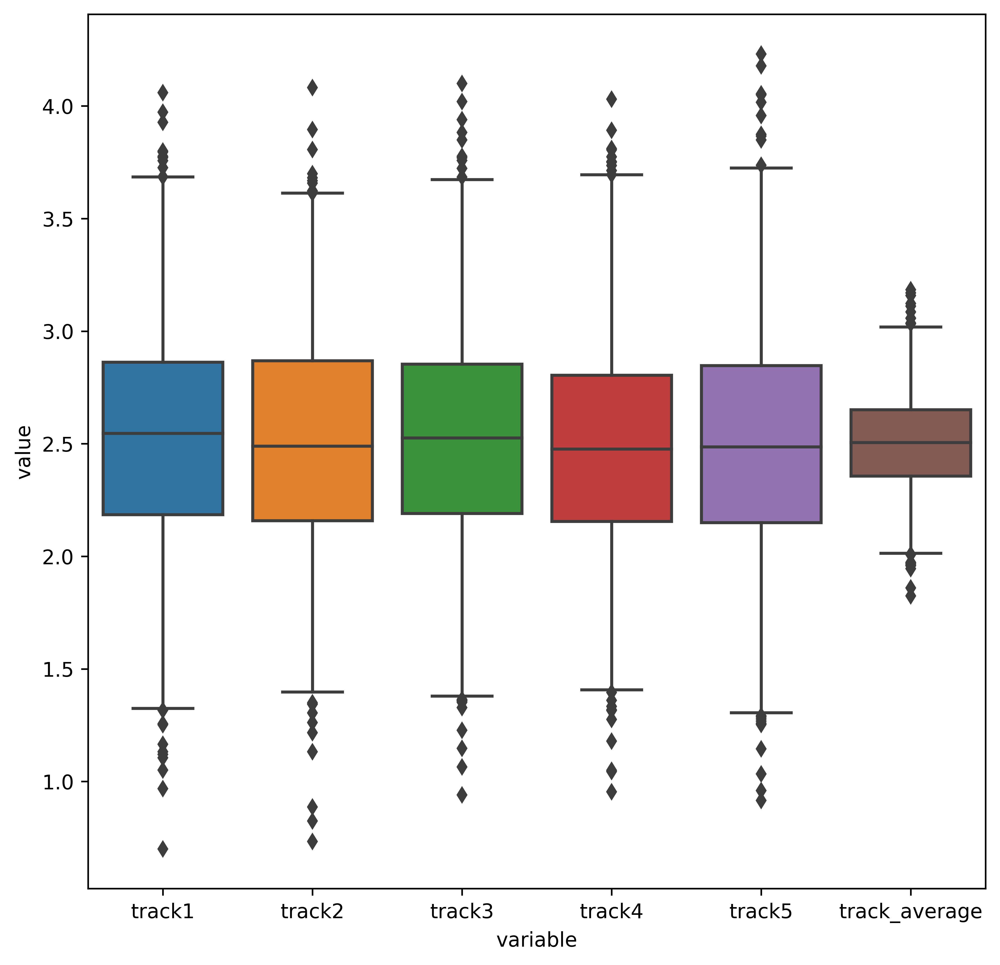

In [ ]:
sns.boxplot(x="variable", y="value", data=pd.melt(df.drop(['distance'], axis=1)), whis=[1,99])

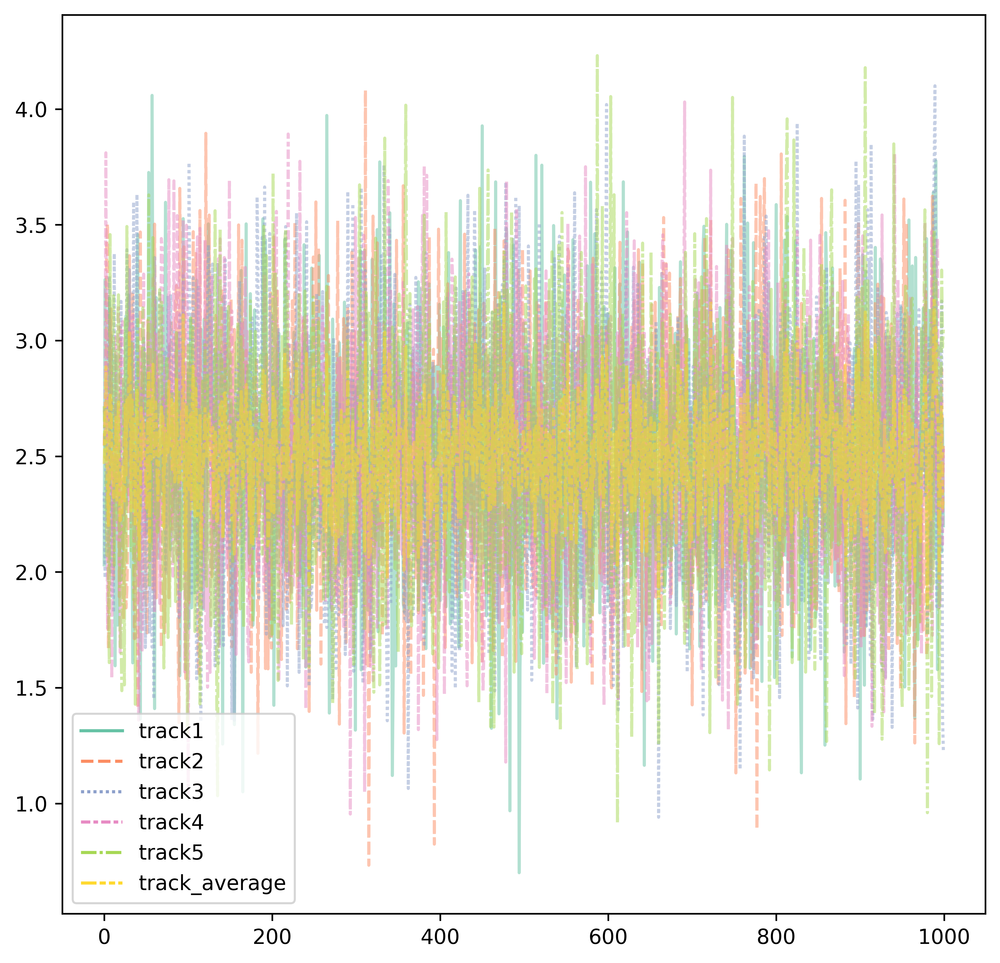

In [ ]:
sns.lineplot(data=df.drop(['distance'], axis=1), palette=sns.color_palette("Set2")[0:6], alpha=0.5)

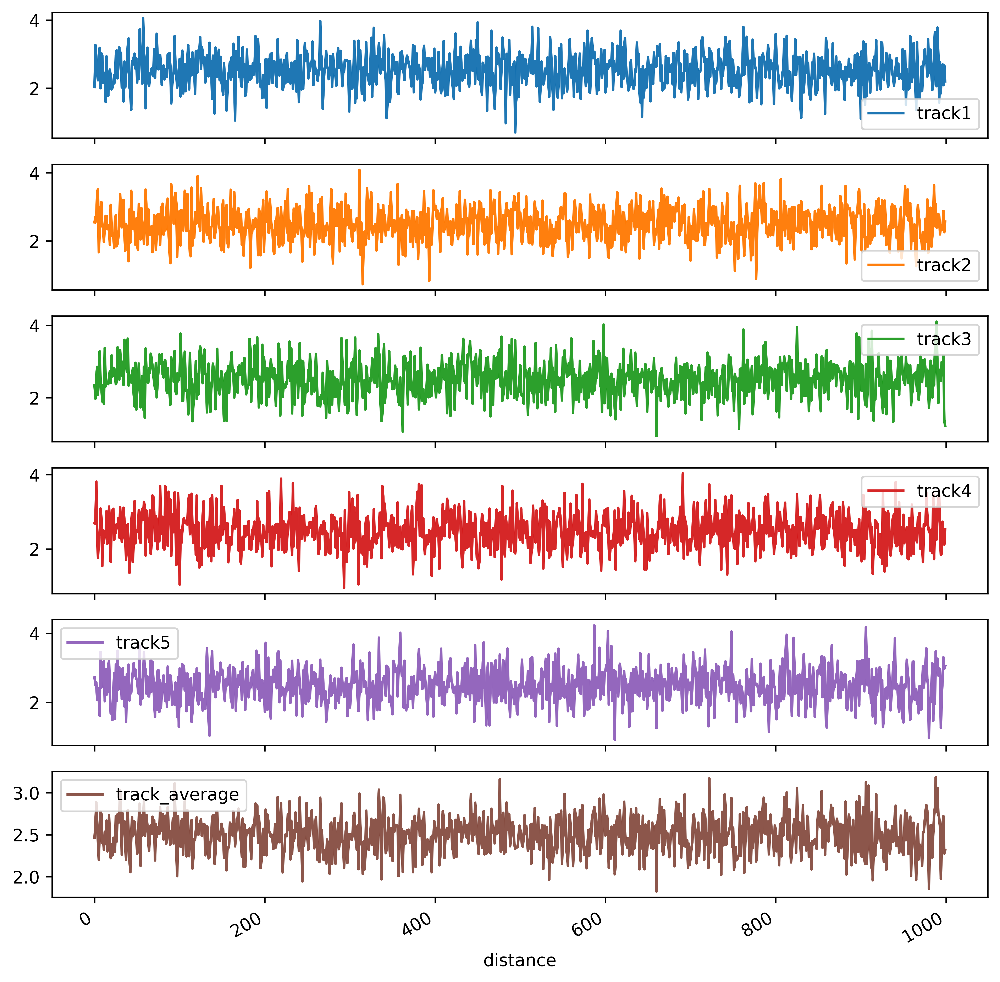

In [ ]:
df.plot(x='distance', subplots=True)
plt.tight_layout()

In [ ]:
mdf = pd.DataFrame()
for i, df in enumerate(dflist):
    cstring = 'c' + str(i)
    mdf[cstring] = df.track_average

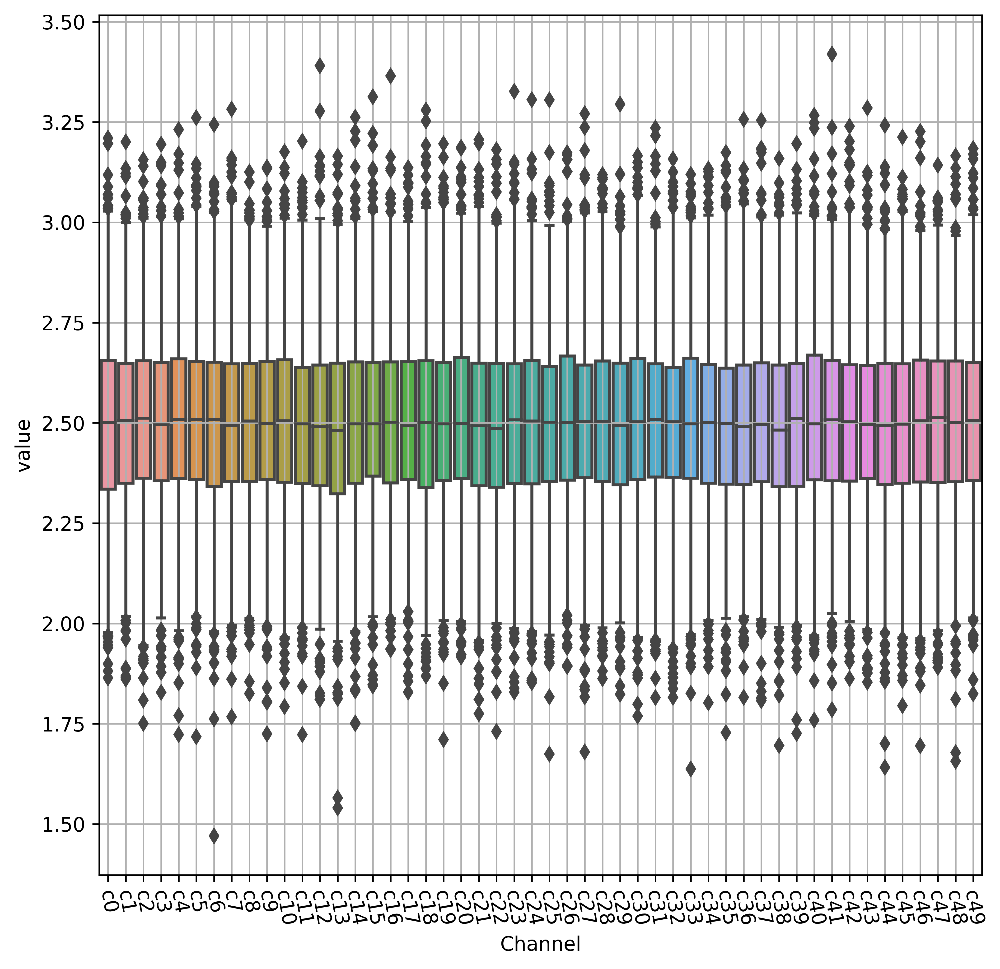

In [ ]:
ax = sns.boxplot(x="variable", y="value", data=pd.melt(mdf), whis=[1,99])
_ = ax.set_xticklabels(ax.get_xticklabels(), rotation=-80)
ax.set_xlabel('Channel')
plt.grid(True)
plt.show()

In [ ]:
# Compute confidence interval for a quantile.
#
# Suppose I'm interested in estimating the 37th percentile.  The
# empirical CDF gives me one estimate for that.  I'd like
# to get a confidence interval: I'm 90% confident that the 37th percentile
# lies between X and Y.
#
# You can compute that with two calls to the following function
# (supposing you're interested in [5%-95%] range) by something like the
# following:
# n = len(sorted_data)
# X_index = CDF_error(n,0.37,0.05)
# Y_index = CDF_error(n,0.37,0.95)
# X=sorted_data[X_index]
# Y=sorted_data[Y_index]
# 90% confidence interval is [X,Y]

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import binom, beta
from scipy import interpolate

# The beta distribution is the correct (pointwise) distribution
# across *quantiles* for a given *data point*; if you're not
# sure, this is probably the estimator you want to use.


def CDF_error_beta(n, target_quantile, quantile_quantile):
    k = target_quantile*n
    return(beta.ppf(quantile_quantile, k, n+1-k))

# Boot strapping can give you a distribution across *values* for a given
# *quantile*.  Warning: Although it is asymptotically correct for quantiles
# in (0,1), bootstrapping fails for the extreme values (i.e. for quantile=0
# or 1.  Moreover, you should be suspicious of confidence intervals for
# points within 1/sqrt(data size).


def CDF_error_analytic_bootstrap(n, target_quantile, quantile_quantile):
    target_count = int(target_quantile*float(n))

    # Start off with a binary search
    small_ind = 0
    big_ind = n-1
    small_prob = 1-binom.cdf(target_count, n, 0)
    big_prob = 1-binom.cdf(target_count, n, float(big_ind)/float(n))

    while big_ind-small_ind > 4:
        mid_ind = (big_ind+small_ind)/2
        mid_prob = 1-binom.cdf(target_count, n, float(mid_ind)/float(n))
        if mid_prob > quantile_quantile:
            big_prob = mid_prob
            big_ind = mid_ind
        else:
            small_prob = mid_prob
            small_ind = mid_ind

    # Finish it off with a linear search
    prob_closest = -100
    for p_num in range(small_ind, big_ind+1):
        p = float(p_num)/float(n)
        coCDF_prob = 1-binom.cdf(target_count, n, p)
        if abs(coCDF_prob-quantile_quantile) < abs(prob_closest-quantile_quantile):
            prob_closest = coCDF_prob
            prob_index = p_num

    return(prob_index)

# Compute Dvoretzky-Kiefer-Wolfowitz confidence bands.


def CDF_error_DKW_band(n, target_quantile, quantile_quantile):
    # alpha is the total confidence interval size, e.g. 90%.
    alpha = 1.0-2.0*np.abs(0.5-quantile_quantile)
    epsilon = np.sqrt(np.log(2.0/alpha)/(2.0*float(n)))
    if quantile_quantile < 0.5:
        return(max((0, target_quantile-epsilon)))
    else:
        return(min((1, target_quantile+epsilon)))


# Plot empirical CDF with confidence intervals.
#   num_quantile_regions=100 means estimate confidence interval at 1%,2%,3%,...,99%.
#   confidence=0.90 mean plot the confidence interval range [5%-95%]
def plot_CDF_confidence(data, num_quantile_regions='all', confidence=0.90, plot_ecdf=True,
                        data_already_sorted=False, color='green', label='', alpha=0.3, estimator_name='beta',
                        ax='use default axes'):
    data = np.array(data)
    if len(np.shape(data)) != 1:
        raise NameError('Data must be 1 dimensional!')
    if len(data) < 2:
        raise NameError('Need at least 2 data points!')
    if num_quantile_regions == 'all':
        num_quantile_regions = len(data)
    if num_quantile_regions > len(data)+1:
        num_quantile_regions = len(data)+1
    if num_quantile_regions < 2:
        raise NameError('Need num_quantile_regions > 1 !')
    if not data_already_sorted:
        data = np.sort(data)
    if ax == 'use default axes':
        ax = plt.gca()
    if confidence <= 0.0 or confidence >= 1.0:
        raise NameError('"confidence" must be between 0.0 and 1.0')
    low_conf = (1.0-confidence)/2.0
    high_conf = 1.0-low_conf

    quantile_list = np.linspace(1.0/float(num_quantile_regions), 1.0-(
        1.0/float(num_quantile_regions)), num=num_quantile_regions-1)

    # Some estimators give confidence intervals on the *quantiles*,
    # others give intervals on the *data*; which do we have?
    if estimator_name == 'analytic bootstrap':
        estimator_type = 'data'
        CDF_error_function = CDF_error_analytic_bootstrap
    elif estimator_name == 'DKW':
        estimator_type = 'quantile'
        CDF_error_function = CDF_error_DKW_band
    elif estimator_name == 'beta':
        estimator_type = 'quantile'
        CDF_error_function = CDF_error_beta
    else:
        raise NameError('Unknown error estimator name %s' % (estimator_name))

    emp_quantile_list = np.linspace(
        1.0/float(len(data)+1), 1.0-(1.0/float(len(data)+1)), num=len(data))

    if estimator_type == 'quantile':
        if num_quantile_regions == len(data)+1:
            interpolated_quantile_list = data
        else:
            invCDF_interp = interpolate.interp1d(emp_quantile_list, data)
            interpolated_quantile_list = invCDF_interp(quantile_list)

    low = np.zeros(np.shape(quantile_list))
    high = np.zeros(np.shape(quantile_list))

    if estimator_type == 'quantile':
        for i, q in enumerate(quantile_list):
            low[i] = CDF_error_function(len(data), q, low_conf)
            high[i] = CDF_error_function(len(data), q, high_conf)
        ax.fill_between(interpolated_quantile_list, low,
                        high, alpha=alpha, color=color, label='Confidence Band')
    elif estimator_type == 'data':
        for i, q in enumerate(quantile_list):
            low[i] = data[CDF_error_function(len(data), q, low_conf)]
            high[i] = data[CDF_error_function(len(data), q, high_conf)]
        ax.fill_betweenx(quantile_list, low, high, alpha=alpha, color=color, label='Confidence Band')
    else:
        raise NameError('Unknown error estimator type %s' % (estimator_type))

    if plot_ecdf:
        ax.plot(data, emp_quantile_list, label=label, color=color)
        
    return low, high, data, quantile_list

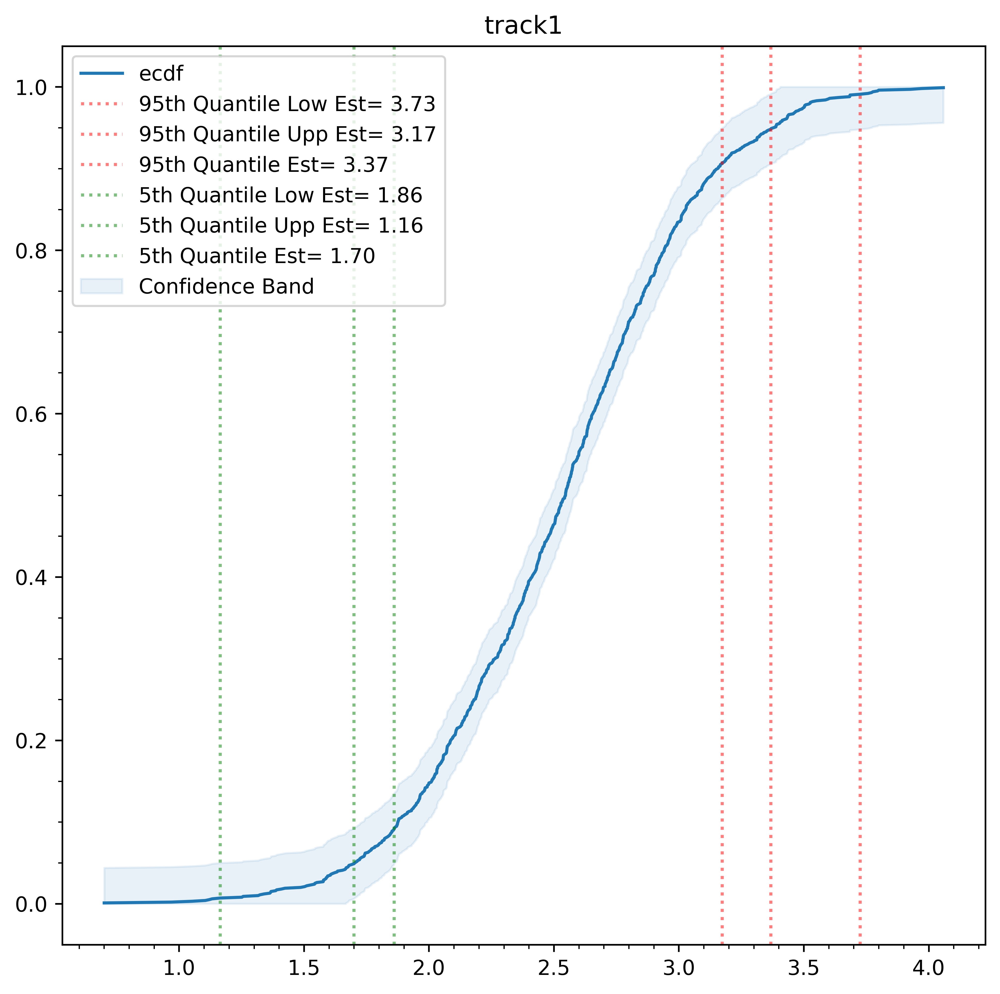

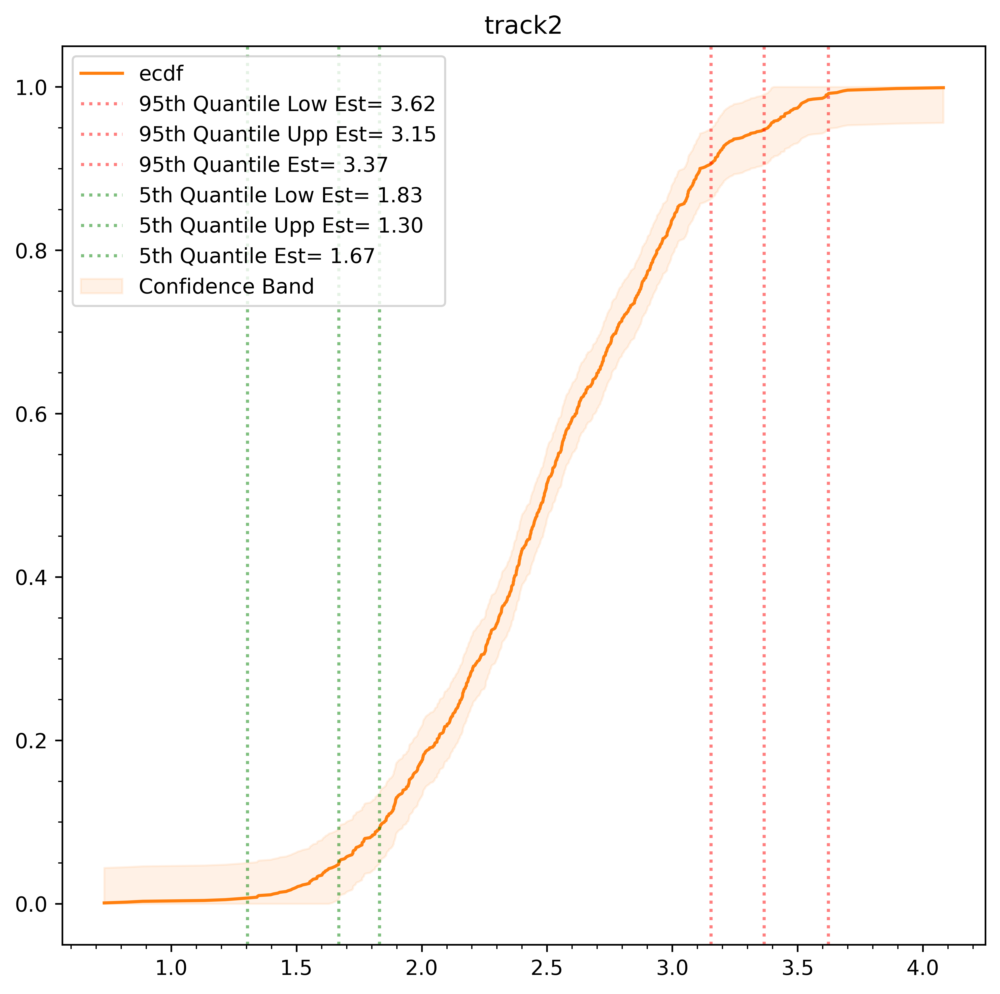

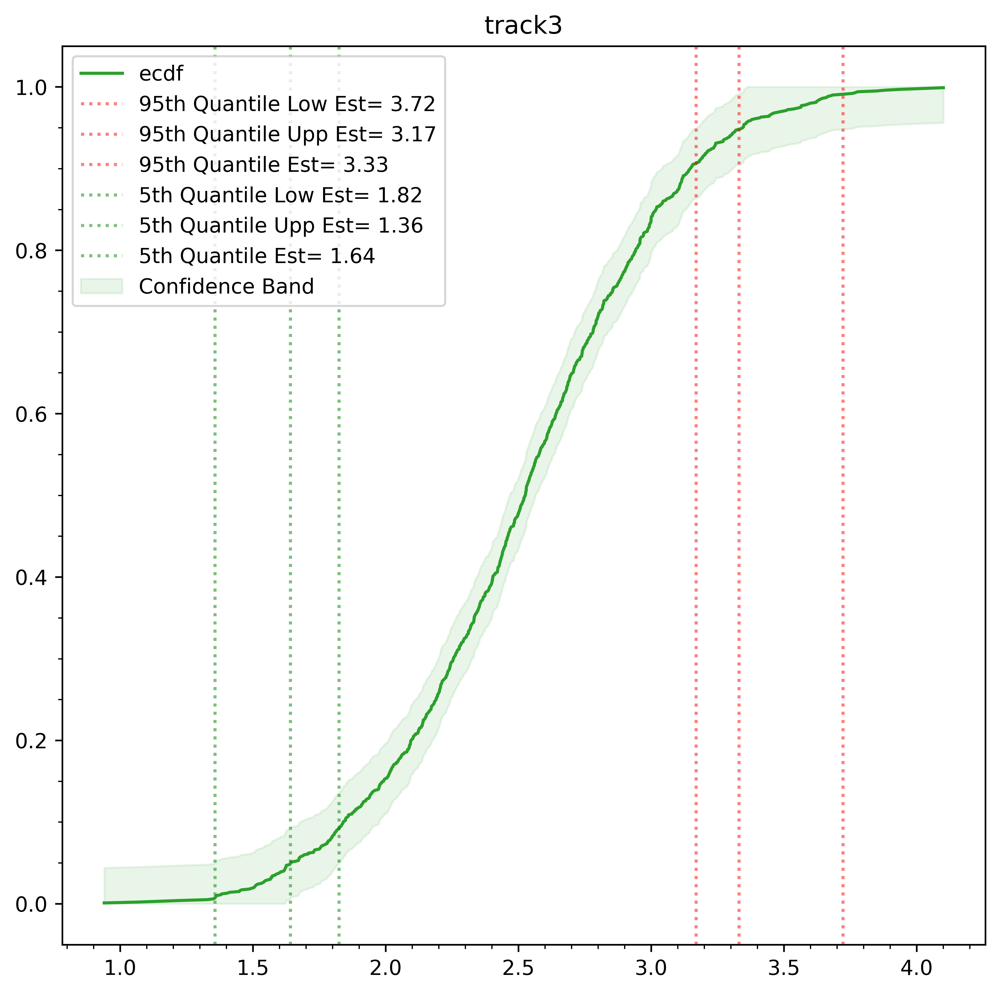

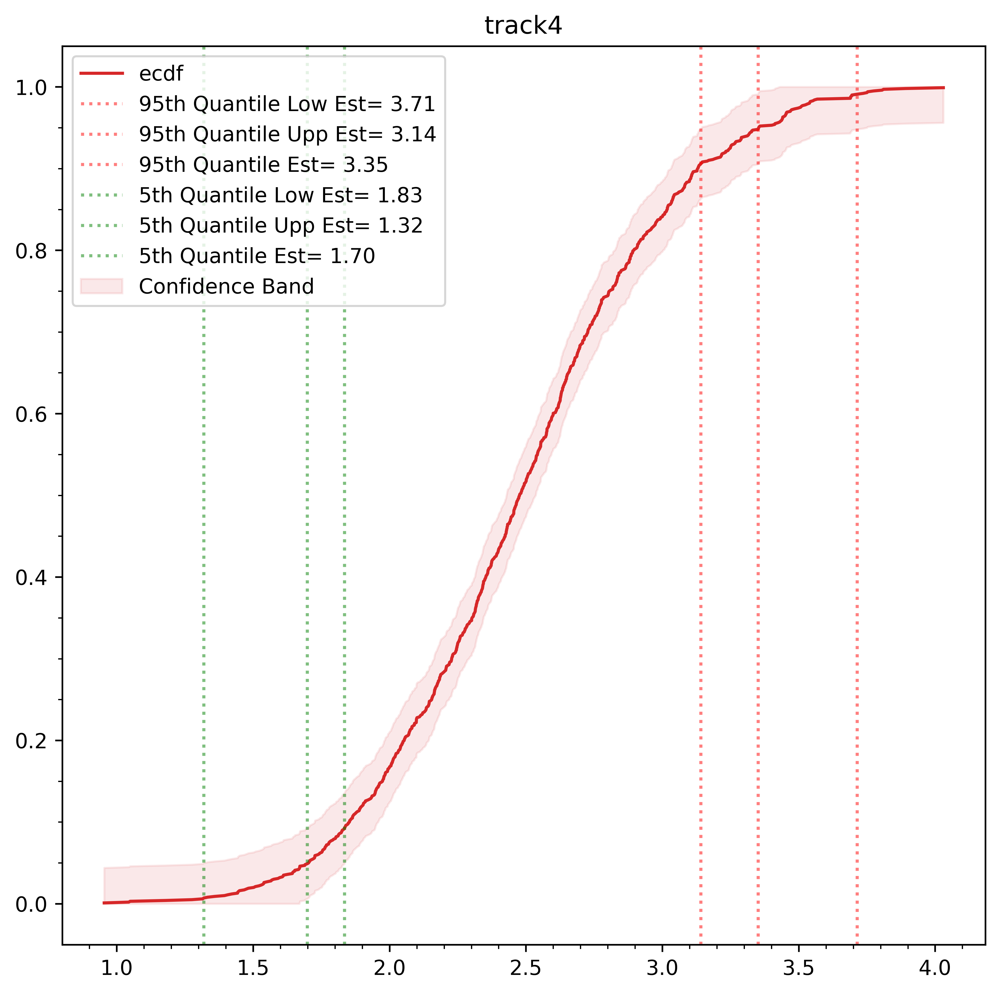

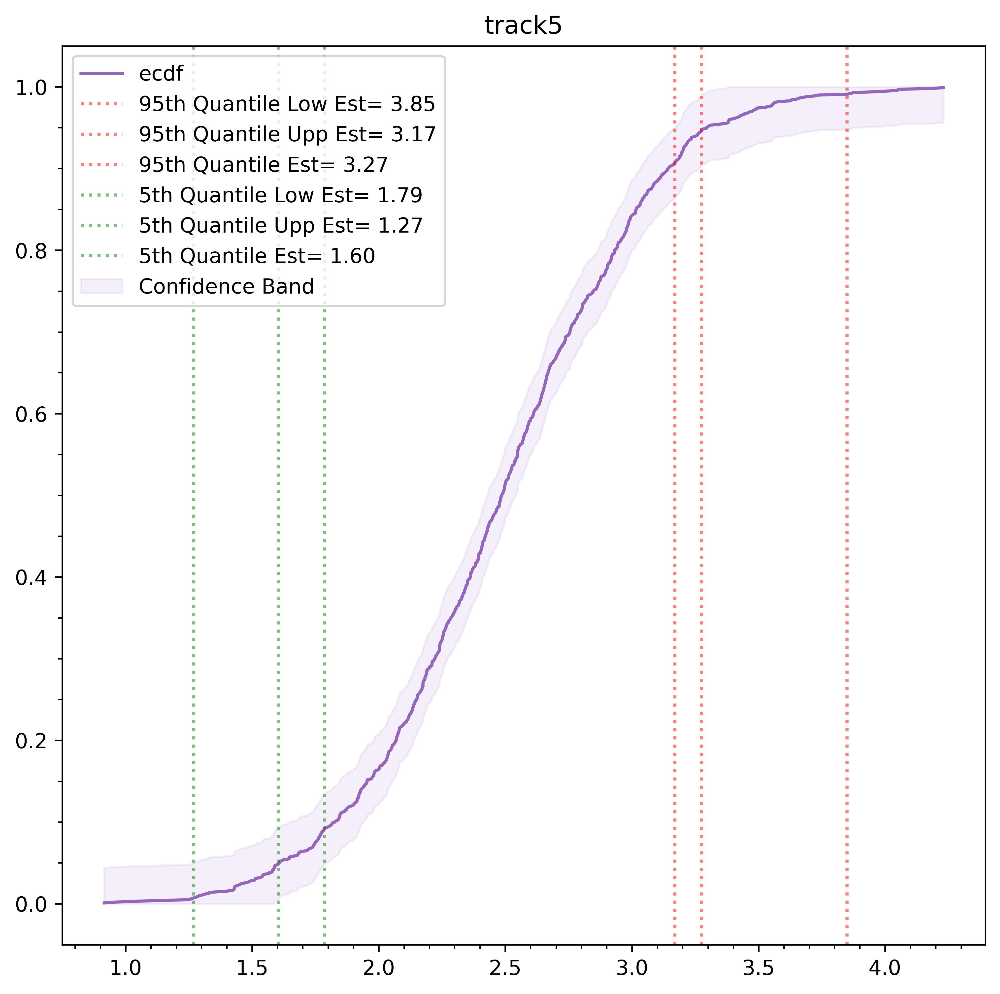

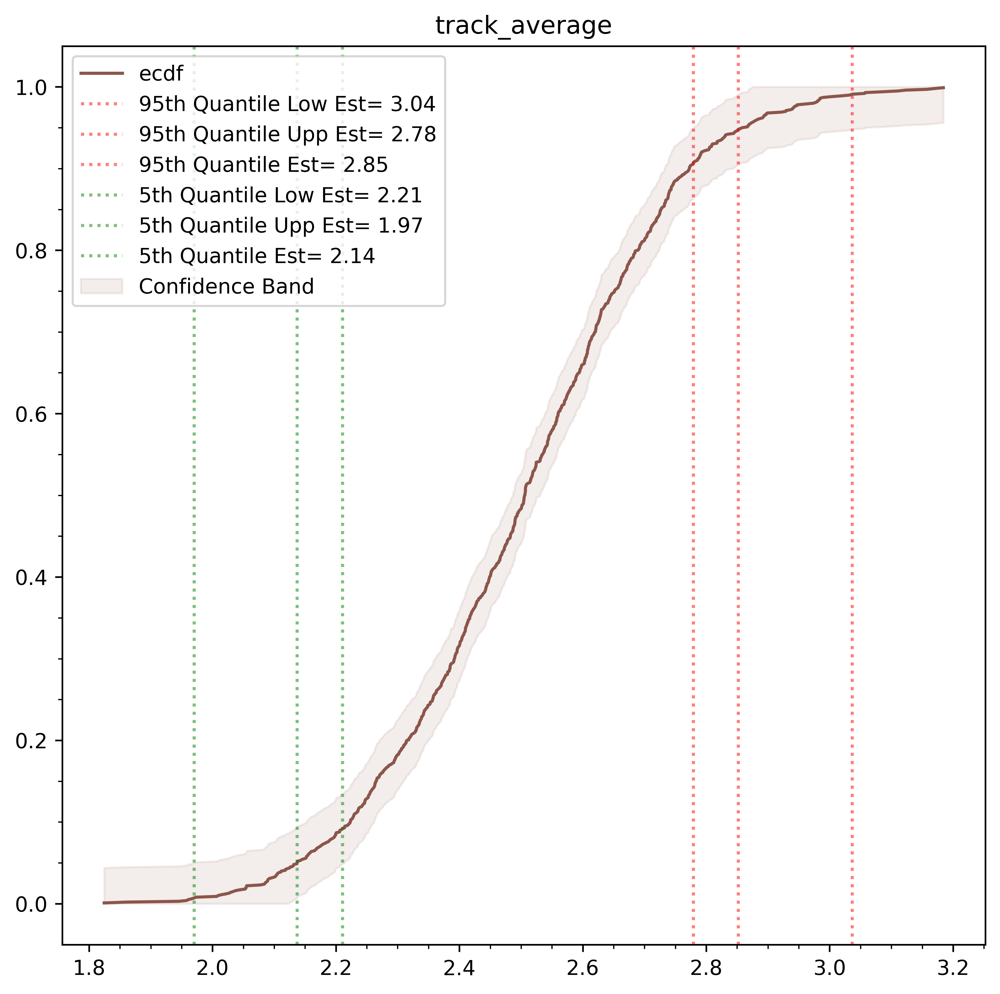

In [ ]:
colors = ['tab:blue', 'tab:orange', 'tab:green', 'tab:red',
          'tab:purple', 'tab:brown', 'tab:pink', 'tab:olive'
          'tab:cyan', 'tab:grey']
dfecdf = pd.DataFrame(range(0, len(df), 1)) #create an appropriately sized dataframe to store ecdf data
for i, p in enumerate(pcols):
    l, h, d, e = plot_CDF_confidence(df[p], num_quantile_regions='all', confidence=0.95, plot_ecdf=True,
                        data_already_sorted=False, color=colors[i], label='ecdf', alpha=0.1, estimator_name='DKW',
                        ax='use default axes')
    idxl = np.argwhere(np.diff(np.sign(l - 0.95))).flatten()[0]
    idxh = np.argwhere(np.diff(np.sign(h - 0.95))).flatten()[0]
    idxd = np.argwhere(np.diff(np.sign(e - 0.95))).flatten()[0]
    plt.axvline(x=d[idxl], color='r', linestyle='dotted', alpha=0.5, label='95th Quantile Low Est=% 1.2f' % (d[idxl]))
    plt.axvline(x=d[idxh], color='r', linestyle='dotted', alpha=0.5, label='95th Quantile Upp Est=% 1.2f' % (d[idxh]))
    plt.axvline(x=d[idxd], color='r', linestyle='dotted', alpha=0.5, label='95th Quantile Est=% 1.2f' % (d[idxd]))
    idxl = np.argwhere(np.diff(np.sign(l - 0.05))).flatten()[0]
    idxh = np.argwhere(np.diff(np.sign(h - 0.05))).flatten()[0]
    idxd = np.argwhere(np.diff(np.sign(e - 0.05))).flatten()[0]
    plt.axvline(x=d[idxl], color='g', linestyle='dotted', alpha=0.5, label='5th Quantile Low Est=% 1.2f' % (d[idxl]))
    plt.axvline(x=d[idxh], color='g', linestyle='dotted', alpha=0.5, label='5th Quantile Upp Est=% 1.2f' % (d[idxh]))
    plt.axvline(x=d[idxd], color='g', linestyle='dotted', alpha=0.5, label='5th Quantile Est=% 1.2f' % (d[idxd]))
    plt.title('%s' % (p))
    plt.minorticks_on()
    plt.legend()
    plt.show()
    plt.close()

In [ ]:
df

,track1,track2,track3,track4,track5,track_average,distance
0,2.030820,2.546054,2.344101,2.697851,2.715951,2.466956,0.0
1,3.263245,2.712205,1.973788,2.680228,2.496275,2.625148,1.0
2,2.927287,2.573512,2.549977,3.810740,2.570542,2.886412,2.0
3,2.493095,3.448705,2.852822,2.442787,2.072169,2.661916,3.0
4,2.230709,3.506569,2.089175,1.755947,2.401456,2.396771,4.0
...,...,...,...,...,...,...,...
995,2.519988,2.319046,2.985364,1.875962,2.151948,2.370462,995.0
996,2.695618,2.415461,2.642264,2.731699,2.663873,2.629783,996.0
997,2.086626,2.878003,3.170153,2.163628,3.303996,2.720481,997.0
998,2.662773,2.255159,1.379446,2.119557,2.970655,2.277518,998.0


### Combining Datasets


1000

### Idea for high level view of the data

I think that we're mostly interesting in finding out which tracks have:
- A big range of values: if the gauge data covers a wide range then that's a cause for concern.
- Clear peaks or troughs in the data.

The range of values can be calculated for each track, for each bundle and plotted on a heatmap accordingly.  In theory a good bundle will have a tight range of values and a bad bundle will have a wide range.

Bundle:

ch t1 t2 t3 t4 t5 ta
 1 1  1  2  2  1  1
..
 n

 Bundles:

 